# Damage function fit

In this notebook we fit the damage function for Burke *et al.*, 2018, Rose *et al.*, 2017, and Howard & Sterner, 2017. I have the data from Burke _et al._, 2018 using their reproduction code (thanks David!), I graph grabber'd the data for the second damage function from the IPCC WGII plot on p. 2880, and the Howard & Sterner data was taken from a figure in their appendix. I then fit the data to a quadratic function.

## Setup

In [1]:
import sys
import datetime
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from scipy.optimize import curve_fit
from matplotlib.ticker import MultipleLocator, FormatStrFormatter, AutoMinorLocator

mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'

# general plot parameters
color_list = ['#000000', '#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7']
marker_list = ['o', 's', 'P', '+', 'D', 'v', '3']
fontsize = 22
labelsize = 20
markersize = 10
figsize = (16, 10)

# plotting parameters
color_list = ['#000000', '#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7'] * 2
marker_list = ['o', 's', 'P', '*', '<', 'v', '>', '^', 'p']
linestyle_list = ['solid', 'dashed', 'dashdot', 'dotted'] * 4
linewidth = 2
node_times = [2020, 2030, 2060, 2100, 2150, 2200]
x_label = 'Year'

%matplotlib inline
%config InlineBackend.figure_format = 'retina' 
plt.rcParams['figure.figsize'] = 16, 10
params = {'legend.fontsize': 18,
          'legend.frameon': True,
          'figure.figsize': (16, 10),
         'axes.labelsize': 20,
         'axes.titlesize': 20,
         'xtick.labelsize': 18,
         'ytick.labelsize': 18,
         'font.family': 'serif'}
plt.rcParams.update(params)

# make base filename
today = datetime.datetime.now()
year = str(today.year)
day = str(today.day)
month = str(today.month)

basefile = ''.join(["/data/keeling/a/adammb4/ClimateEcon/ez-climate/TCREZClimate/docs/figdump/", month, '-', day, '-', year, '-'])
path = '/data/keeling/a/adammb4/ClimateEcon/ez-climate/TCREZClimate/data/'

## General fitting function

Each one of our damage functions follow the same damage function fitting and uncertainty estimation.

In [2]:
def fitted_curve(loc, scale, conc_mult):
    """Get fitted polynomial coefficients.
    
    Parameters
    ----------
    loc: float
        guess for mean curve fit parameter D_1d
    
    scale: float
        guess for std deviaion of curve fit parameter D_1d
    
    conc_mult: float
        multiple to determine concavity. If concave up, conc_mult > 1. 
        If concave down, 0 < conc_mult < 1.
    
    Returns
    -------
    b2d: (N_draws,) numpy array
        distribution of second order coefficient in fitted polynomial
    
    b1d: (N_draws,) numpy array
        distribution of first order coefficient in fitted polynomial
    """
    
    T_1 = 3
    T_2 = 10

    N_draws = 10000
    D_1d = np.random.normal(loc=loc, scale=scale, size=N_draws)
    D_2d = D_1d * (T_2 * T_1**(-1)) * conc_mult

    b2d = (D_2d * T_1 - D_1d * T_2) * (T_1 * T_2 * (T_2 - T_1))**(-1)
    b1d = (D_1d * T_2**2 - D_2d * T_1**2) * (T_1 * T_2 * (T_2 - T_1))**(-1)
    
    print("First order mean: ", np.mean(b1d), 
      "\nSecond order mean: ", np.mean(b2d), 
      "\nFirst order std dev: ", np.std(b1d), 
      "\nSecond order std dev:", np.std(b2d))
    
    return b2d, b1d

def f(x, a, b):
    return a * x**2 + b * x

def g(x, a, b):
    return a * x + b

## Burke _et al._, 2018 damage functions

There is a damage function per SSP in this one, so it's a more involved process than the others.

In [3]:
# mid century
burke_2049_ssp1 = np.genfromtxt(''.join([path, 'ssp1_2049_t_d.csv']), delimiter=',')
burke_2049_ssp1_t, burke_2049_ssp1_d = burke_2049_ssp1.T

burke_2049_ssp2 = np.genfromtxt(''.join([path, 'ssp2_2049_t_d.csv']), delimiter=',')
burke_2049_ssp2_t, burke_2049_ssp2_d = burke_2049_ssp2.T

burke_2049_ssp3 = np.genfromtxt(''.join([path, 'ssp3_2049_t_d.csv']), delimiter=',')
burke_2049_ssp3_t, burke_2049_ssp3_d = burke_2049_ssp3.T

burke_2049_ssp4 = np.genfromtxt(''.join([path, 'ssp4_2049_t_d.csv']), delimiter=',')
burke_2049_ssp4_t, burke_2049_ssp4_d = burke_2049_ssp4.T

burke_2049_ssp5 = np.genfromtxt(''.join([path, 'ssp5_2049_t_d.csv']), delimiter=',')
burke_2049_ssp5_t, burke_2049_ssp5_d = burke_2049_ssp5.T

# end of century
burke_2099_ssp1 = np.genfromtxt(''.join([path, 'ssp1_2099_t_d.csv']), delimiter=',')
burke_2099_ssp1_t, burke_2099_ssp1_d = burke_2099_ssp1.T

burke_2099_ssp2 = np.genfromtxt(''.join([path, 'ssp2_2099_t_d.csv']), delimiter=',')
burke_2099_ssp2_t, burke_2099_ssp2_d = burke_2099_ssp2.T

burke_2099_ssp3 = np.genfromtxt(''.join([path, 'ssp3_2099_t_d.csv']), delimiter=',')
burke_2099_ssp3_t, burke_2099_ssp3_d = burke_2099_ssp3.T

burke_2099_ssp4 = np.genfromtxt(''.join([path, 'ssp4_2099_t_d.csv']), delimiter=',')
burke_2099_ssp4_t, burke_2099_ssp4_d = burke_2099_ssp4.T

burke_2099_ssp5 = np.genfromtxt(''.join([path, 'ssp5_2099_t_d.csv']), delimiter=',')
burke_2099_ssp5_t, burke_2099_ssp5_d = burke_2099_ssp5.T

### SSP1

Mid-century:
First order mean:  0.00893449902161347 
Second order mean:  0.00536069941296808 
First order std dev:  0.0011851268119737594 
Second order std dev: 0.0007110760871842555

End-of-century:
First order mean:  0.07040906600079755 
Second order mean:  -0.0012385897943306748 
First order std dev:  0.013976389100285157 
Second order std dev: 0.0002458634077181423


(0.0, 0.7)

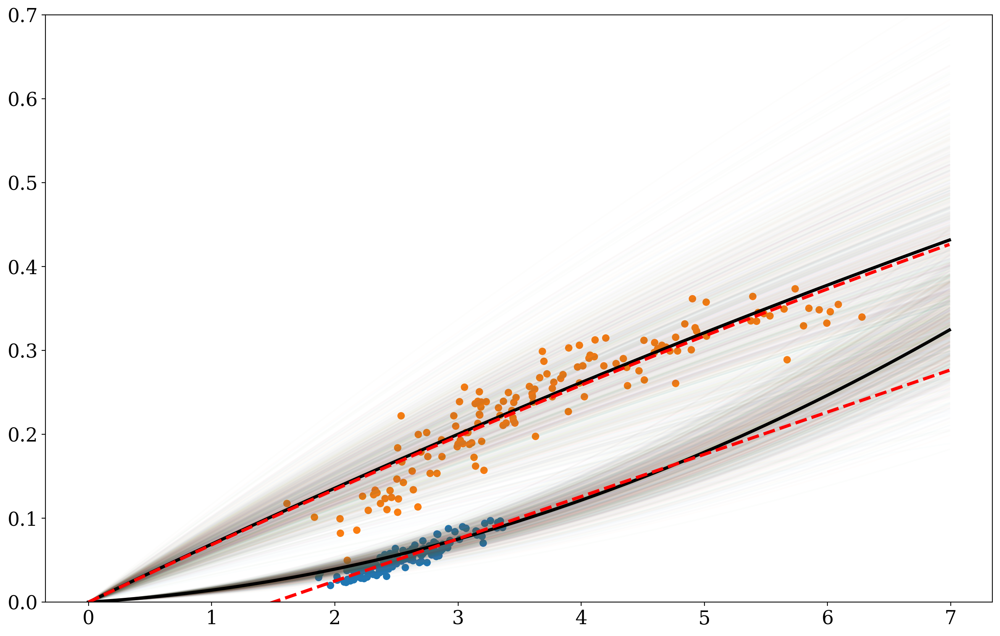

In [4]:
burke_fit = curve_fit(g, burke_2049_ssp1_t, burke_2049_ssp1_d)
burke_means, burke_covars = burke_fit
burke_a_mean, burke_b_mean = burke_means

burke_fit_end = curve_fit(f, burke_2099_ssp1_t, burke_2099_ssp1_d)
burke_mean_end, burke_covars_end = burke_fit_end
burke_a_mean_end, burke_b_mean_end = burke_mean_end

print("Mid-century:")
burke_ssp1_mid_d2, burke_ssp1_mid_d1 = fitted_curve(0.075, 0.01, 2.5)

print("\nEnd-of-century:")
burke_ssp1_end_d2, burke_ssp1_end_d1 = fitted_curve(0.2, 0.04, .87)

temp = np.arange(0, 7, 0.01)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp1_mid_d1[i] + burke_ssp1_mid_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp1_mid_d1) + np.mean(burke_ssp1_mid_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * burke_a_mean + burke_b_mean, linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2049_ssp1_t, burke_2049_ssp1_d)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp1_end_d1[i] + burke_ssp1_end_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp1_end_d1) + np.mean(burke_ssp1_end_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * (burke_a_mean_end * temp + burke_b_mean_end), linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2099_ssp1_t, burke_2099_ssp1_d)

plt.ylim(0,0.7)

### SSP2

Mid-century:
First order mean:  0.01239953642612512 
Second order mean:  0.0030998841065312793 
First order std dev:  0.0019103614218312199 
Second order std dev: 0.0004775903554578048

End-of-century:
First order mean:  0.07173669880632304 
Second order mean:  -0.0023140870582684862 
First order std dev:  0.014693827518629918 
Second order std dev: 0.0004739944360848362


(0.0, 0.7)

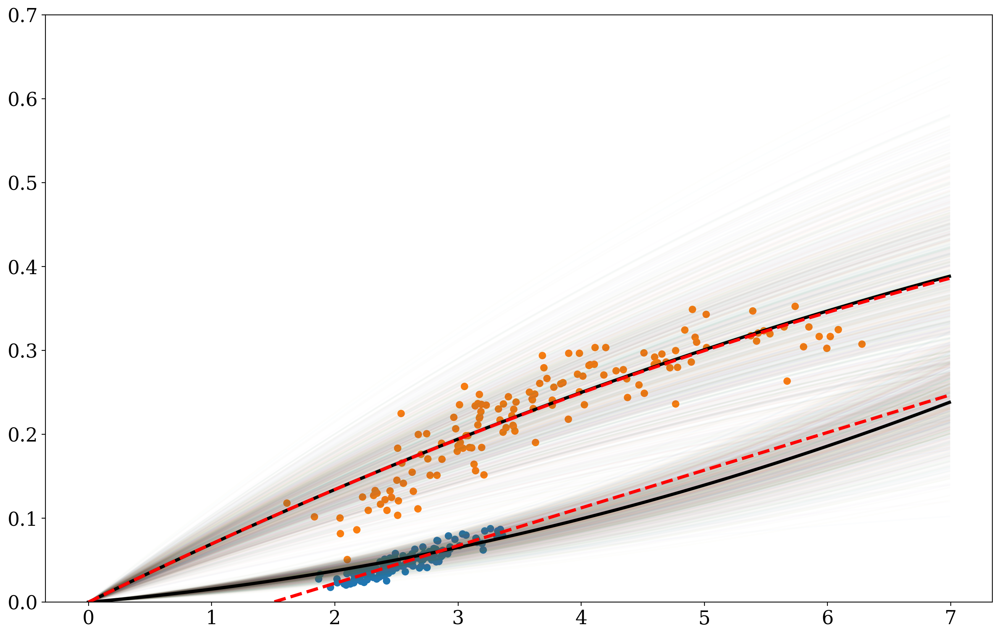

In [5]:
burke_fit = curve_fit(g, burke_2049_ssp2_t, burke_2049_ssp2_d)
burke_means, burke_covars = burke_fit
burke_a_mean, burke_b_mean = burke_means

burke_fit_end = curve_fit(f, burke_2099_ssp2_t, burke_2099_ssp2_d)
burke_mean_end, burke_covars_end = burke_fit_end
burke_a_mean_end, burke_b_mean_end = burke_mean_end

print("Mid-century:")
burke_ssp2_mid_d2, burke_ssp2_mid_d1 = fitted_curve(0.065, 0.01, 2)

print("\nEnd-of-century:")
burke_ssp2_end_d2, burke_ssp2_end_d1 = fitted_curve(0.195, 0.04, .75)

temp = np.arange(0, 7, 0.01)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp2_mid_d1[i] + burke_ssp2_mid_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp2_mid_d1) + np.mean(burke_ssp2_mid_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * burke_a_mean + burke_b_mean, linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2049_ssp2_t, burke_2049_ssp2_d)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp2_end_d1[i] + burke_ssp2_end_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp2_end_d1) + np.mean(burke_ssp2_end_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * (burke_a_mean_end * temp + burke_b_mean_end), linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2099_ssp2_t, burke_2099_ssp2_d)

plt.ylim(0,0.7)

### SSP3

Mid-century:
First order mean:  0.011789274841536329 
Second order mean:  0.0029473187103840805 
First order std dev:  0.001906990983077132 
Second order std dev: 0.0004767477457692829

End-of-century:
First order mean:  0.07184434553929717 
Second order mean:  -0.0028085431421415036 
First order std dev:  0.015131544648233226 
Second order std dev: 0.0005915231829700255


(0.0, 0.7)

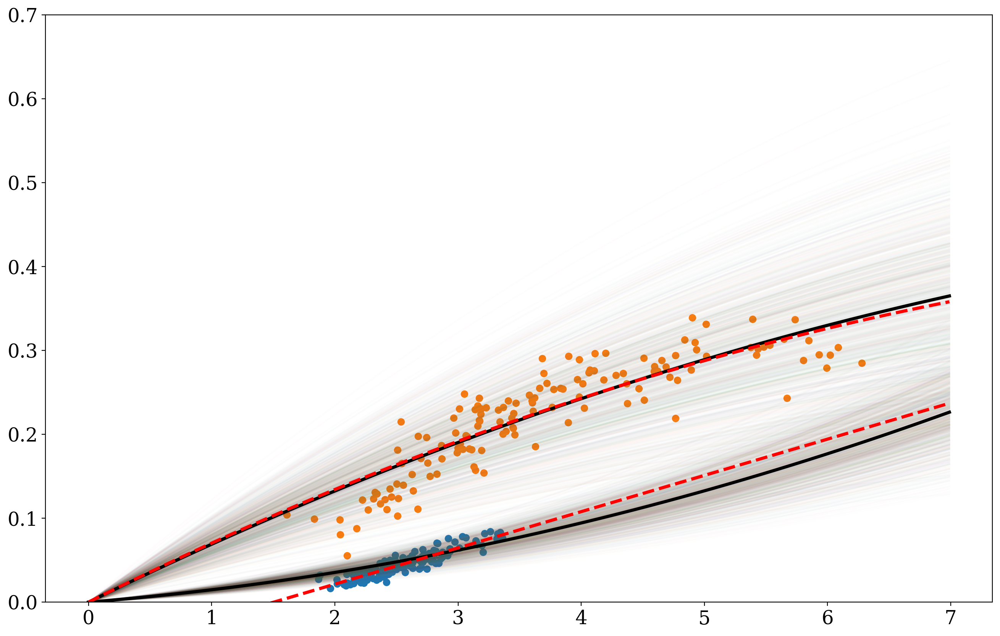

In [6]:
burke_fit = curve_fit(g, burke_2049_ssp3_t, burke_2049_ssp3_d)
burke_means, burke_covars = burke_fit
burke_a_mean, burke_b_mean = burke_means

burke_fit_end = curve_fit(f, burke_2099_ssp3_t, burke_2099_ssp3_d)
burke_mean_end, burke_covars_end = burke_fit_end
burke_a_mean_end, burke_b_mean_end = burke_mean_end

print("Mid-century:")
burke_ssp3_mid_d2, burke_ssp3_mid_d1 = fitted_curve(0.062, 0.01, 2)

print("\nEnd-of-century:")
burke_ssp3_end_d2, burke_ssp3_end_d1 = fitted_curve(0.19, 0.04, .69)

temp = np.arange(0, 7, 0.01)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp3_mid_d1[i] + burke_ssp3_mid_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp3_mid_d1) + np.mean(burke_ssp3_mid_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * burke_a_mean + burke_b_mean, linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2049_ssp3_t, burke_2049_ssp3_d)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp3_end_d1[i] + burke_ssp3_end_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp3_end_d1) + np.mean(burke_ssp3_end_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * (burke_a_mean_end * temp + burke_b_mean_end), linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2099_ssp3_t, burke_2099_ssp3_d)

plt.ylim(0,0.7)

### SSP4

Mid-century:
First order mean:  0.005834429383046441 
Second order mean:  0.003500657629827863 
First order std dev:  0.0011855845089809892 
Second order std dev: 0.0007113507053885932

End-of-century:
First order mean:  0.04674809057265981 
Second order mean:  -0.0011160021622120381 
First order std dev:  0.014388348939528712 
Second order std dev: 0.0003434884362221711


(0.0, 0.7)

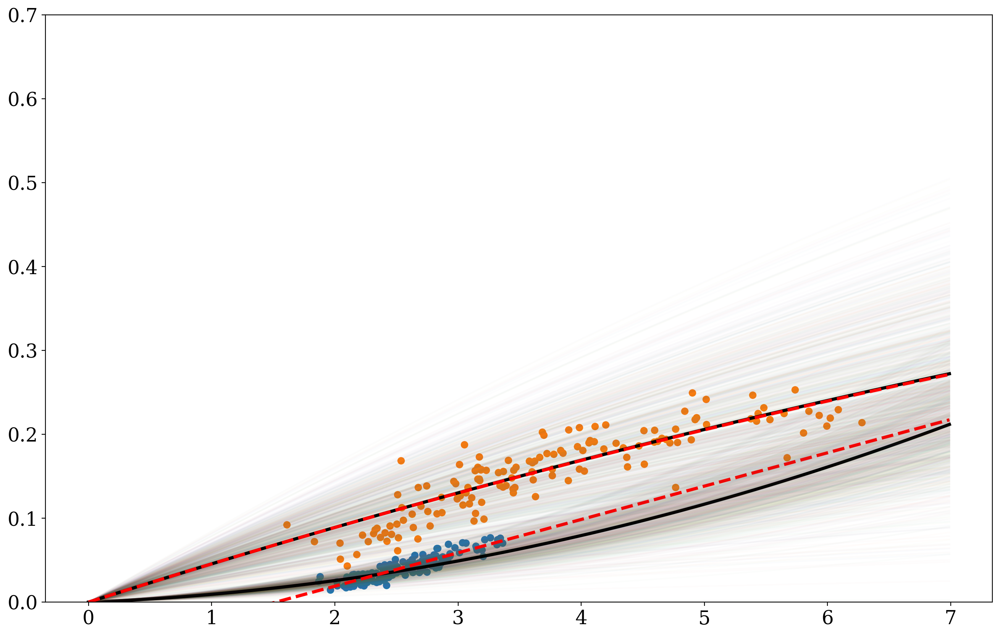

In [7]:
burke_fit = curve_fit(g, burke_2049_ssp4_t, burke_2049_ssp4_d)
burke_means, burke_covars = burke_fit
burke_a_mean, burke_b_mean = burke_means

burke_fit_end = curve_fit(f, burke_2099_ssp4_t, burke_2099_ssp4_d)
burke_mean_end, burke_covars_end = burke_fit_end
burke_a_mean_end, burke_b_mean_end = burke_mean_end

print("Mid-century:")
burke_ssp4_mid_d2, burke_ssp4_mid_d1 = fitted_curve(0.049, 0.01, 2.5)

print("\nEnd-of-century:")
burke_ssp4_end_d2, burke_ssp4_end_d1 = fitted_curve(0.13, 0.04, .82)

temp = np.arange(0, 7, 0.01)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp4_mid_d1[i] + burke_ssp4_mid_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp4_mid_d1) + np.mean(burke_ssp4_mid_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * burke_a_mean + burke_b_mean, linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2049_ssp4_t, burke_2049_ssp4_d)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp4_end_d1[i] + burke_ssp4_end_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp4_end_d1) + np.mean(burke_ssp4_end_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * (burke_a_mean_end * temp + burke_b_mean_end), linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2099_ssp4_t, burke_2099_ssp4_d)

plt.ylim(0,0.7)

### SSP5

Mid-century:
First order mean:  0.011441180800972443 
Second order mean:  0.003401432130018834 
First order std dev:  0.0017545362000869634 
Second order std dev: 0.0005216188702961242

End-of-century:
First order mean:  0.05561236488163861 
Second order mean:  -0.0013276161377579515 
First order std dev:  0.014449069122023603 
Second order std dev: 0.000344937989650431


(0.0, 0.7)

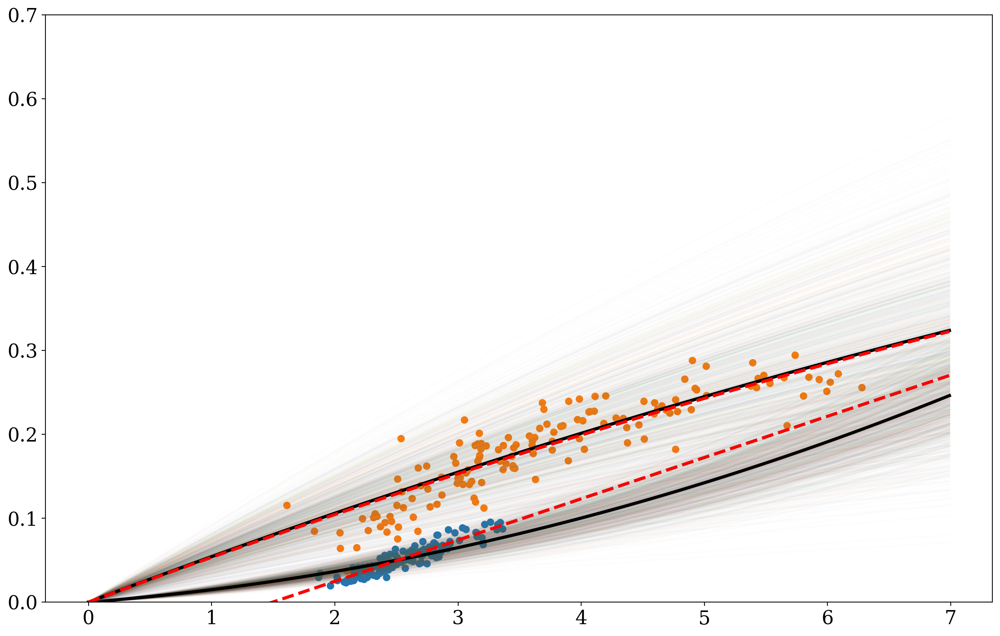

In [8]:
burke_fit = curve_fit(g, burke_2049_ssp5_t, burke_2049_ssp5_d)
burke_means, burke_covars = burke_fit
burke_a_mean, burke_b_mean = burke_means

burke_fit_end = curve_fit(f, burke_2099_ssp5_t, burke_2099_ssp5_d)
burke_mean_end, burke_covars_end = burke_fit_end
burke_a_mean_end, burke_b_mean_end = burke_mean_end

print("Mid-century:")
burke_ssp5_mid_d2, burke_ssp5_mid_d1 = fitted_curve(0.065, 0.01, 2.1)

print("\nEnd-of-century:")
burke_ssp5_end_d2, burke_ssp5_end_d1 = fitted_curve(0.155, 0.04, .82)

temp = np.arange(0, 7, 0.01)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp5_mid_d1[i] + burke_ssp5_mid_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp5_mid_d1) + np.mean(burke_ssp5_mid_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * burke_a_mean + burke_b_mean, linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2049_ssp5_t, burke_2049_ssp5_d)

for i in range(1000):
    plt.plot(temp, temp * (burke_ssp5_end_d1[i] + burke_ssp5_end_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(burke_ssp5_end_d1) + np.mean(burke_ssp5_end_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * (burke_a_mean_end * temp + burke_b_mean_end), linestyle='dashed', color='r', linewidth=3)
plt.scatter(burke_2099_ssp5_t, burke_2099_ssp5_d)

plt.ylim(0,0.7)

## Structural damage function

In [9]:
struct_data = np.genfromtxt("/data/keeling/a/adammb4/ClimateEcon/ez-climate/TCREZClimate/data/IPCC_WGII_RoseDamageEstimates.csv", delimiter=',', usecols=[0,1])

In [10]:
struct_T, struct_dam = struct_data.T

Structural df:
First order mean:  0.002055144116913949 
Second order mean:  0.00231203713152819 
First order std dev:  0.0007686381472192609 
Second order std dev: 0.0008647179156216677


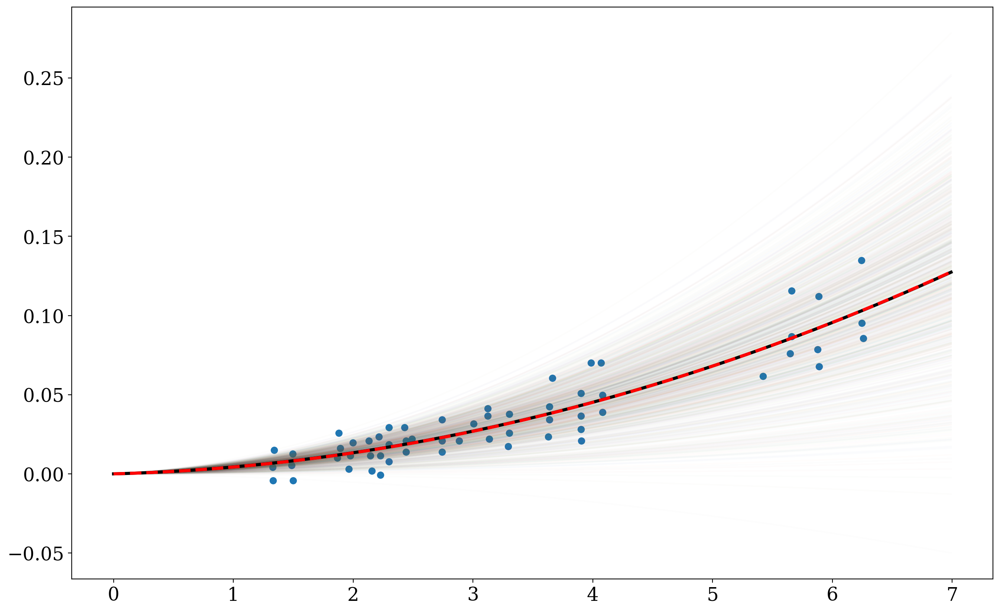

In [19]:
struct_fit = curve_fit(f, struct_T, struct_dam)
struct_means, struct_covars = struct_fit
struct_a_mean, struct_b_mean = struct_means

print("Structural df:")
struct_d2, struct_d1 = fitted_curve(0.027, 0.01, 2.8)

# double check fit (uncomment below)
dist_d2 = np.random.normal(loc=0.0023056898884004605, scale=0.0008591468977763477, size=1000)
dist_d1 = np.random.normal(loc=0.0020495021230226337, scale=0.0007636861313567542, size=1000)

temp = np.arange(0, 7, 0.01)

for i in range(1000):
    plt.plot(temp, temp * (struct_d1[i] + struct_d2[i] * temp), alpha=0.01)
    #plt.plot(temp, temp * (dist_d1[i] + dist_d2[i] * temp), alpha=0.01, color='r')

plt.plot(temp, temp * (np.mean(struct_d1) + np.mean(struct_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * (struct_a_mean* temp + struct_b_mean), linestyle='dashed', color='r', linewidth=3)
plt.scatter(struct_T, struct_dam)

## Meta-analytic damage function

In [12]:
hs_data = np.genfromtxt("/data/keeling/a/adammb4/ClimateEcon/ez-climate/TCREZClimate/data/IPCC_WGII_HowardSternerDamageEstimates.csv", delimiter=',', usecols=[0,1])

In [13]:
hs_T, hs_dam = hs_data.T

Structural df:
First order mean:  0.00030013901594816287 
Second order mean:  0.006903197366807649 
First order std dev:  0.00010613053962800531 
Second order std dev: 0.002441002411444088


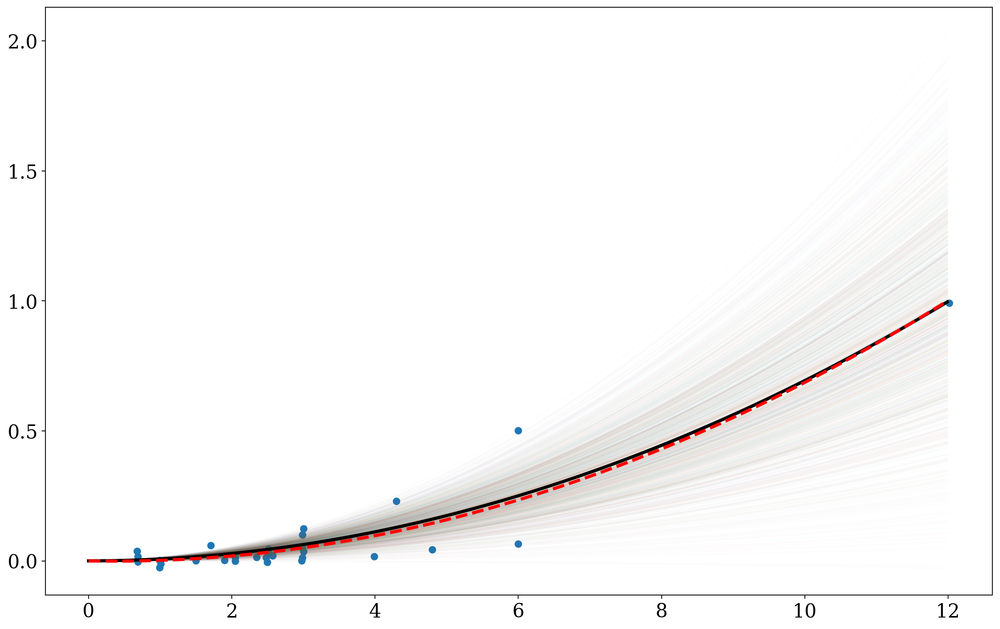

In [14]:
hs_fit = curve_fit(f, hs_T, hs_dam)
hs_means, hs_covars = hs_fit
hs_a_mean, hs_b_mean = hs_means

print("Structural df:")
hs_d2, hs_d1 = fitted_curve(0.063, 0.022, 3.3)

temp = np.arange(0, 12, 0.01)

for i in range(1000):
    plt.plot(temp, temp * (hs_d1[i] + hs_d2[i] * temp), alpha=0.01)

plt.plot(temp, temp * (np.mean(hs_d1) + np.mean(hs_d2) * temp), color='k', linewidth=3)   
plt.plot(temp, temp * (hs_a_mean * temp + hs_b_mean), linestyle='dashed', color='r', linewidth=3)
plt.scatter(hs_T, hs_dam)

# Old stuff

Anything below this is pretty abysmal coding. The most recent version of the code uses the calibrations above. But I'm leaving it in for posterity.

## First method

Direct fit to the data.

In [116]:
def f(x, a, b):
    return a * x**2 + b * x

def g(x, a, b):
    return a * (1 - np.exp(-b * x))

def h(x, a, b):
    return a * (np.exp(b * x) - 1)

burke_fit = curve_fit(f, burke_T, burke_dam)
burke_means, burke_covars = burke_fit
burke_a_mean, burke_b_mean = burke_means
burke_a_std, burke_b_std = np.sqrt(np.diag(burke_covars))

struct_fit = curve_fit(f, struct_T, struct_dam)
struct_means, struct_covars = struct_fit
struct_a_mean, struct_b_mean = struct_means
struct_a_std, struct_b_std = np.sqrt(np.diag(struct_covars))

hs_fit = curve_fit(f, hs_T, hs_dam)
hs_means, hs_covars = hs_fit
hs_a_mean, hs_b_mean = hs_means
hs_a_std, hs_b_std = np.sqrt(np.diag(hs_covars))

print(hs_a_mean, hs_b_mean)

NameError: name 'burke_T' is not defined

I've tried

$f(x) = 1 - a^{-x}$ (and many variants of this)

$f(x) = a \tanh(bx) + c$

for the Burke, and the one above, $f(x) = a (1 - \exp(- bx))$ seems to do best. Rose and Howard & Sterner are quadratics which require $D(T'=0) = 0$, i.e., no zeroth order term.

In [117]:
num_fits = 1000
burke_sampling = np.random.multivariate_normal(burke_means, burke_covars, size=num_fits)
burke_as, burke_bs = burke_sampling.T

hs_sampling = np.random.multivariate_normal(hs_means, hs_covars, size=num_fits)
hs_as, hs_bs = hs_sampling.T

rose_sampling = np.random.multivariate_normal(struct_means, struct_covars, size=num_fits)
rose_as, rose_bs = rose_sampling.T

NameError: name 'burke_T' is not defined

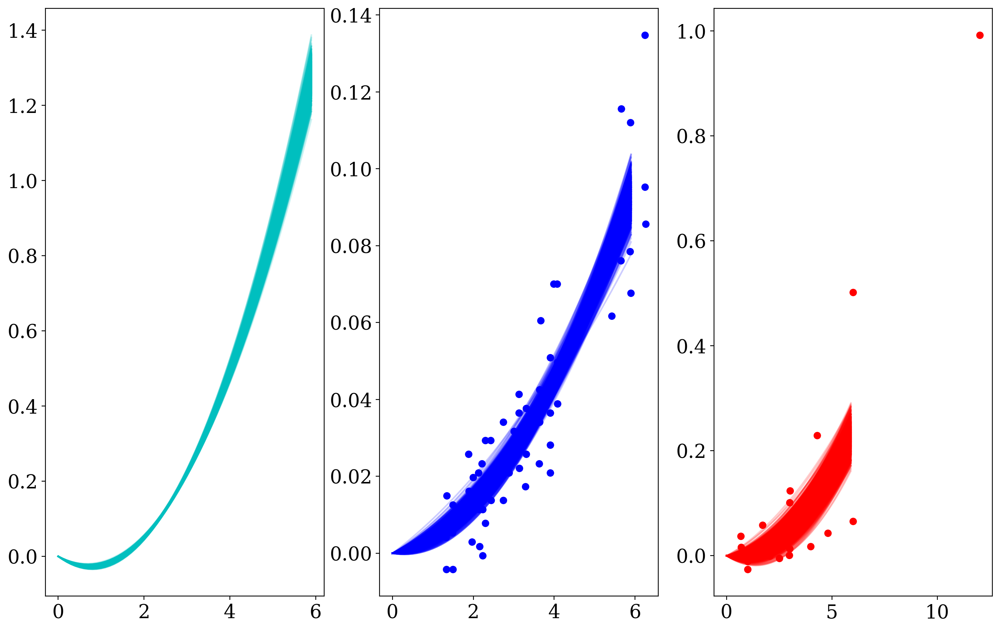

In [118]:
T = np.arange(0, 6, 0.1)
fig, ax = plt.subplots(1,3,figsize=figsize)

burke_fit = burke_as[:, None] * T**2 + burke_bs[:, None] * T 

hs_fit = hs_as[:, None] * T**2 + hs_bs[:, None] * T 

rose_fit = rose_as[:, None] * T**2 + rose_bs[:, None] * T 

for i in range(num_fits):
    ax[0].plot(T, burke_fit[i,:], color='c', alpha=0.2)
    ax[1].plot(T, rose_fit[i,:], color='b', alpha=0.2)
    ax[2].plot(T, hs_fit[i,:], color='r', alpha=0.2)
    
ax[2].scatter(hs_T, hs_dam, color='r')
ax[1].scatter(struct_T, struct_dam, color='b')
ax[0].scatter(burke_T, burke_dam, color='c')

ax[0].set_title("Burke", fontsize=fontsize+4)
ax[1].set_title("Rose et al.", fontsize=fontsize+4)
ax[2].set_title("Howard & Sterner", fontsize=fontsize+4)

for i in range(3):
    ax[i].set_xlabel("Temperature Anomaly (K)", fontsize=fontsize)
    ax[i].tick_params(axis="both", labelsize=labelsize)
    ax[i].set_xlim((0,6))
    ax[i].set_ylim((-0.1,0.5))

ax[0].set_ylabel("Damage (Fraction of global GDP)", fontsize=fontsize)

The problem with the straight-up fitting method is that if you get a large enough anomaly in the polynomial parameters you can get (a) flips in concavity, (b) negative damages at high temperatures, and (c) large departures from physically reasonable damages (i.e., > 1 damages for T' < 2). 

So, we go for a more strict fitting method, where we "eyeball" a fit to the mean state above and impose stricter rules on the variations from the mean, namely, not allowing the concavity change when new samples are drawn. This leads to the uncertainty envelopes below not being unphysical, i.e., not having the defective features mentioned above.

## Second method

Calibrate my old fitting method to the data.

In [ ]:
T_1 = 3
T_2 = 10

N_draws = 3 * 10**6
mult = 1
t = 260.0
#D_1d = np.random.normal(loc=0.215, scale=0.025 * mult, size=N_draws)
D_1d = np.random.gamma(shape=0.215 * t * 1.2, scale=(t * 1.2)**(-1), size=N_draws)
D_2d = D_1d * (T_2 * T_1**(-1)) * 0.67

#D_1u = np.random.normal(loc=0.039, scale=0.005 * mult, size=N_draws)
D_1u = np.random.gamma(shape=0.029 * t, scale=t**(-1), size=N_draws)
D_2u = D_1u * (T_2 * T_1**(-1)) * 1.7

# calculated alpha and D_1hs_mean specifically to fit above
alpha_num = 100 + 10 * hs_b_mean * hs_a_mean**(-1)
alpha_denom = 10 * hs_b_mean * hs_a_mean**(-1) + 30
alpha = alpha_num * alpha_denom**(-1)

D_1hs_mean = 210 * hs_a_mean * (10 * (alpha - 1))**(-1)
#print(alpha, D_1hs_mean)

#D_1hs = np.random.normal(loc=D_1hs_mean, scale=0.009 * mult, size=N_draws)
ttt = t * 1.5
D_1hs = np.random.gamma(shape=D_1hs_mean * ttt, scale=ttt**(-1), size=N_draws)
D_2hs = D_1hs * (T_2 * T_1**(-1)) * alpha

b2d = (D_2d * T_1 - D_1d * T_2) * (T_1 * T_2 * (T_2 - T_1))**(-1)
b1d = (D_1d * T_2**2 - D_2d * T_1**2) * (T_1 * T_2 * (T_2 - T_1))**(-1)

a2u = (D_2u * T_1 - D_1u * T_2) * (T_1 * T_2 * (T_2 - T_1))**(-1)
a1u = (D_1u * T_2**2 - D_2u * T_1**2) * (T_1 * T_2 * (T_2 - T_1))**(-1)

a2hs = (D_2hs * T_1 - D_1hs * T_2) * (T_1 * T_2 * (T_2 - T_1))**(-1)
a1hs = (D_1hs * T_2**2 - D_2hs * T_1**2) * (T_1 * T_2 * (T_2 - T_1))**(-1)

burke_m1, burke_m2 = np.mean(b2d), np.mean(b1d)
st_1, st_2 = np.mean(a2u), np.mean(a1u)
hs_1, hs_2 = np.mean(a2hs), np.mean(a1hs)

np.mean(b2d), np.mean(b1d), np.std(b2d), np.std(b1d), np.mean(a2u), np.mean(a1u), np.std(a2u), np.std(a1u), np.mean(a2hs), np.mean(a1hs), np.std(a2hs), np.std(a1hs)

In [ ]:
polyd = T * (b2d[:, None] * T + b1d[:, None])
polyd[polyd > 1] = 1
polyd[polyd < 0] = 0

maxpolyd = np.max(polyd[:,-1])
lowpolyd = np.min(polyd[:,-1])
maxindex = np.where(polyd[:,-1] == maxpolyd)[0]
lowindex = np.where(polyd[:,-1] == lowpolyd)[0]
upperpolyd = polyd[maxindex,:]
lowerpolyd = polyd[lowindex,:]

polyu = T * (a2u[:, None] * T + a1u[:, None])
polyu[polyu < 0] = 0

maxpolyu = np.max(polyu[:,-1])
lowpolyu = np.min(polyu[:,-1])
maxindex = np.where(polyu[:,-1] == maxpolyu)[0]
lowindex = np.where(polyu[:,-1] == lowpolyu)[0]
upperpolyu = polyu[maxindex,:]
lowerpolyu = polyu[lowindex,:]

polyhs = T * (a2hs[:, None] * T + a1hs[:, None])
polyhs[polyhs < 0] = 0

maxpolyhs = np.max(polyhs[:,-1])
lowpolyhs = np.min(polyhs[:,-1])
maxindexhs = np.where(polyhs[:,-1] == maxpolyhs)[0]
lowindexhs = np.where(polyhs[:,-1] == lowpolyhs)[0]
upperpolyhs = polyhs[maxindexhs,:]
lowerpolyhs = polyhs[lowindexhs,:]

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(18,10))

ax[0].plot(T, upperpolyd[0,:], color=color_list[0], linestyle='dashed')
ax[0].plot(T, lowerpolyd[0,:], color=color_list[0], linestyle='dashed')
ax[0].plot(T, T * (burke_m1 * T + burke_m2), color=color_list[0], label='Mean Burke Curve Fit')
ax[0].scatter(burke_T, burke_dam, color=color_list[0], alpha=0.5, marker=marker_list[0], label="Burke et al., 2015 Data")
ax[0].fill_between(T, lowerpolyd[0,:], upperpolyd[0,:], alpha=0.2, color=color_list[0])
#ax[0].plot(T, burke_fit, color='b', linestyle='dotted', label='Mean fitted')
ax[0].legend(fontsize=16)

ax[1].plot(T, upperpolyu[0,:], color=color_list[1], linestyle='dashed')
ax[1].plot(T, T * (st_1 * T + st_2), color=color_list[1], label='Mean Rose et al. Curve Fit')
ax[1].plot(T, lowerpolyu[0,:], color=color_list[1], linestyle='dashed')
ax[1].scatter(struct_T, struct_dam, color=color_list[1], alpha=0.5, marker=marker_list[1], label="Rose et al., 2017 Data")
ax[1].fill_between(T, lowerpolyu[0,:], upperpolyu[0,:], alpha=0.2, color=color_list[1])
#ax[1].plot(T, struct_fit, color='b', linestyle='dotted', label='Mean fitted')

ax[2].plot(T, upperpolyhs[0,:], color=color_list[2], linestyle='dashed')
ax[2].plot(T, T * (hs_1 * T + hs_2), color=color_list[2], label='Howard & Sterner Curve Fit')
ax[2].plot(T, lowerpolyhs[0,:], color=color_list[2], linestyle='dashed')
ax[2].scatter(hs_T, hs_dam, color=color_list[2], alpha=0.5, marker=marker_list[2], label="Howard & Sterner Data")
ax[2].fill_between(T, lowerpolyhs[0,:], upperpolyhs[0,:], alpha=0.2, color=color_list[2])
#ax[2].plot(T, hs_fit, color='k', linestyle='dotted', label='Mean fitted')
    
for j in range(3):
    ax[j].set_xlim((0,6))
    ax[j].set_xlabel("Temperature (K)", fontsize=22)
    ax[j].set_ylabel("Damage (% GDP)", fontsize=22)
    ax[j].tick_params(axis='both', labelsize=20)
    ax[j].set_ylim((0,0.7))
    
fig.tight_layout()
#fig.savefig("/data/keeling/a/adammb4/ClimateEcon/ez-climate/TCREZClimate/docs/figdump/damage-function-fits.png", dpi=400)

### Note on Burke *et al.* fit above

Damage functions are allowed to be concave, i.e., have a negative second derivative, but must *always* be increasing with temperature, i.e., always have a positive first derivative. This implies that the data-fit mean damage curve for the Burke data is unphysical, which justifies our correction.

## IPCC WGII Figure Cross-Working Group Box ECONOMIC.1, our version

Here we plot all the damage functions and their fits in a grid, as well as a final figure with all of the damage functions superimposed.

In [ ]:
scatter_alpha = 0.6
fill_alpha = 0.1
burke_color=0
rose_color=1
hs_color = 2

fig, ax = plt.subplots(2, 2, figsize=(12,12), sharex=True, sharey=True)

ax[0,0].plot(T, upperpolyd[0,:], color=color_list[burke_color], linestyle='dashed')
ax[0,0].plot(T, lowerpolyd[0,:], color=color_list[burke_color], linestyle='dashed')
ax[0,0].plot(T, T * (burke_m1 * T + burke_m2), color=color_list[burke_color], label='Burke $et \ al.$, 2015: Curve Fit')
ax[0,0].scatter(burke_T, burke_dam, color=color_list[burke_color], alpha=scatter_alpha, marker=marker_list[2], label="Burke $et \ al.$, 2015: Data")
ax[0,0].fill_between(T, lowerpolyd[0,:], upperpolyd[0,:], alpha=fill_alpha, color=color_list[burke_color])
#ax.plot(T, burke_fit, color='b', linestyle='dotted', label='Mean fitted')
ax[0,0].set_title("Statistically estimated")

ax[0,1].plot(T, upperpolyu[0,:], color=color_list[rose_color], linestyle='dashed')
ax[0,1].plot(T, T * (st_1 * T + st_2), color=color_list[rose_color], label='Rose $et \ al.$, 2017: Curve Fit')
ax[0,1].plot(T, lowerpolyu[0,:], color=color_list[rose_color], linestyle='dashed')
ax[0,1].scatter(struct_T, struct_dam, color=color_list[rose_color], alpha=scatter_alpha, marker=marker_list[1], label=r"Rose $et \ al.$, 2017: Data")
ax[0,1].fill_between(T, lowerpolyu[0,:], upperpolyu[0,:], alpha=fill_alpha, color=color_list[rose_color])
#ax.plot(T, struct_fit, color='b', linestyle='dotted', label='Mean fitted')
ax[0,1].set_title("Structurally estimated")


ax[1,0].plot(T, upperpolyhs[0,:], color=color_list[hs_color], linestyle='dashed')
ax[1,0].plot(T, T * (hs_1 * T + hs_2), color=color_list[hs_color], label='Howard & Sterner, 2017: Curve Fit')
ax[1,0].plot(T, lowerpolyhs[0,:], color=color_list[hs_color], linestyle='dashed')
ax[1,0].scatter(hs_T, hs_dam, color=color_list[hs_color], alpha=scatter_alpha, marker=marker_list[0], label="Howard & Sterner, 2017: Data")
ax[1,0].fill_between(T, lowerpolyhs[0,:], upperpolyhs[0,:], alpha=0.2, color=color_list[hs_color])
ax[1,0].set_title("Meta-analytic")


ax[1,1].plot(T, upperpolyd[0,:], color=color_list[burke_color], linestyle='dashed')
ax[1,1].plot(T, lowerpolyd[0,:], color=color_list[burke_color], linestyle='dashed')
ax[1,1].plot(T, T * (burke_m1 * T + burke_m2), color=color_list[burke_color], label='Burke $et \ al.$, 2015: Curve Fit')
ax[1,1].scatter(burke_T, burke_dam, color=color_list[burke_color], alpha=scatter_alpha, marker=marker_list[2], label="Burke $et \ al.$, 2015: Data")
ax[1,1].fill_between(T, lowerpolyd[0,:], upperpolyd[0,:], alpha=fill_alpha, color=color_list[burke_color])
#ax.plot(T, burke_fit, color='b', linestyle='dotted', label='Mean fitted')

ax[1,1].plot(T, upperpolyu[0,:], color=color_list[rose_color], linestyle='dashed')
ax[1,1].plot(T, T * (st_1 * T + st_2), color=color_list[rose_color], label='Rose $et \ al.$, 2017: Curve Fit')
ax[1,1].plot(T, lowerpolyu[0,:], color=color_list[rose_color], linestyle='dashed')
ax[1,1].scatter(struct_T, struct_dam, color=color_list[rose_color], alpha=scatter_alpha, marker=marker_list[1], label=r"Rose $et \ al.$, 2017: Data")
ax[1,1].fill_between(T, lowerpolyu[0,:], upperpolyu[0,:], alpha=fill_alpha, color=color_list[rose_color])
#ax.plot(T, struct_fit, color='b', linestyle='dotted', label='Mean fitted')

ax[1,1].plot(T, upperpolyhs[0,:], color=color_list[hs_color], linestyle='dashed')
ax[1,1].plot(T, T * (hs_1 * T + hs_2), color=color_list[hs_color], label='Howard & Sterner, 2017: Curve Fit')
ax[1,1].plot(T, lowerpolyhs[0,:], color=color_list[hs_color], linestyle='dashed')
ax[1,1].scatter(hs_T, hs_dam, color=color_list[hs_color], alpha=scatter_alpha, marker=marker_list[0], label="Howard & Sterner, 2017: Data")
ax[1,1].fill_between(T, lowerpolyhs[0,:], upperpolyhs[0,:], alpha=0.2, color=color_list[hs_color])

for i in range(2):
    for j in range(2):
        ax[i,j].set_xlim((0,6))
        ax[1,j].set_xlabel("Temperature anomaly ($^{\circ}$C)", fontsize=22)
        ax[i,0].set_ylabel("Damage (fraction of global GDP)", fontsize=22)
        ax[i,j].tick_params(axis='both', labelsize=20)
        ax[i,j].set_ylim((0,0.7))
        
        ax[i,j].xaxis.set_major_locator(MultipleLocator(2))
        ax[i,j].xaxis.set_major_formatter(FormatStrFormatter('%d'))
        
        ax[i,j].yaxis.set_major_locator(MultipleLocator(0.2))
        ax[i,j].yaxis.set_major_formatter(FormatStrFormatter('%1.1f'))
        
        ax[i,j].xaxis.set_minor_locator(MultipleLocator(1))
        ax[i,j].yaxis.set_minor_locator(MultipleLocator(0.1))

fig.tight_layout()
#fig.savefig("/data/keeling/a/adammb4/ClimateEcon/ez-climate/TCREZClimate/docs/figdump/damage-function-fits-grid.png", dpi=400)

## V2

In [ ]:
scatter_alpha = 0.6
fill_alpha = 0.1
burke_color=0
rose_color=1
hs_color = 2

fig, ax = plt.subplots(1, 3, figsize=(12,6), sharey=True)

ax[0].plot(T, upperpolyd[0,:], color=color_list[burke_color], linestyle='dashed')
ax[0].plot(T, lowerpolyd[0,:], color=color_list[burke_color], linestyle='dashed')
ax[0].plot(T, T * (burke_m1 * T + burke_m2), color=color_list[burke_color], label='Burke $et \ al.$, 2015: Curve Fit')
ax[0].scatter(burke_T, burke_dam, color=color_list[burke_color], alpha=scatter_alpha, marker=marker_list[2], label="Burke $et \ al.$, 2015: Data")
ax[0].fill_between(T, lowerpolyd[0,:], upperpolyd[0,:], alpha=fill_alpha, color=color_list[burke_color])
#ax.plot(T, burke_fit, color='b', linestyle='dotted', label='Mean fitted')
ax[0].set_title("Statistically estimated")

ax[1].plot(T, upperpolyu[0,:], color=color_list[rose_color], linestyle='dashed')
ax[1].plot(T, T * (st_1 * T + st_2), color=color_list[rose_color], label='Rose $et \ al.$, 2017: Curve Fit')
ax[1].plot(T, lowerpolyu[0,:], color=color_list[rose_color], linestyle='dashed')
ax[1].scatter(struct_T, struct_dam, color=color_list[rose_color], alpha=scatter_alpha, marker=marker_list[1], label=r"Rose $et \ al.$, 2017: Data")
ax[1].fill_between(T, lowerpolyu[0,:], upperpolyu[0,:], alpha=fill_alpha, color=color_list[rose_color])
#ax.plot(T, struct_fit, color='b', linestyle='dotted', label='Mean fitted')
ax[1].set_title("Structurally estimated")


ax[2].plot(T, upperpolyhs[0,:], color=color_list[hs_color], linestyle='dashed')
ax[2].plot(T, T * (hs_1 * T + hs_2), color=color_list[hs_color], label='Howard & Sterner, 2017: Curve Fit')
ax[2].plot(T, lowerpolyhs[0,:], color=color_list[hs_color], linestyle='dashed')
ax[2].scatter(hs_T, hs_dam, color=color_list[hs_color], alpha=scatter_alpha, marker=marker_list[0], label="Howard & Sterner, 2017: Data")
ax[2].fill_between(T, lowerpolyhs[0,:], upperpolyhs[0,:], alpha=0.2, color=color_list[hs_color])
ax[2].set_title("Meta-analytic")


ax[0].set_ylabel("Damage (fraction of global GDP)", fontsize=18)

labels = ["(a)", "(b)", "(c)"]
for i in range(3):
        ax[i].set_xlim((0,6))
        ax[i].set_ylim((-0.7,0.7))
        ax[i].text(5.15, 0.65, labels[i], fontsize=20)
        ax[i].set_xlabel("Temperature anomaly ($^{\circ}$C)", fontsize=18)
        
fig.tight_layout()
fig.savefig(''.join([basefile, 'dam-v2.png']), dpi=400)

In [ ]:
T_1 = 3
T_2 = 10

D_1 = np.random.normal(loc=0.05682, scale=0.009, size=10**2)
D_2 = D_1 * (T_2 * T_1**(-1)) * 3.6621

b2 = (D_2 * T_1 - D_1 * T_2) * (T_1 * T_2 * (T_2 - T_1))**(-1)
b1 = (D_1 * T_2**2 - D_2 * T_1**2) * (T_1 * T_2 * (T_2 - T_1))**(-1)

temp = np.arange(0, 6, 0.1)
d = temp * (b1[:, None] + b2[:, None] * temp)
for i in range(0, 10**2):
    plt.plot(temp, d[i,:])